# Лабораторная 5 — DreamBooth + LoRA на Stable Diffusion 1.5

**Дедлайн:** 26.03 · **Баллов:** 10

**Ход работы:**

- С помощью предобученной модели text2img сгенерировать фотографии себя в разном окружении (киберпанк, металл, эльфийский город и т.п.).
- Показать **5 качественных** изображений себя — должно сохраняться портретное сходство.
- Показать изображения, сгенерированные по тексту `<ваш токен> in a forest / city / beach` с уточнениями `high quality`, `realism`.
- Показать изображения, сгенерированные по тексту `<ваш пол> in a forest / city / beach` — после дообучения модель **не должна разучиться** генерировать других людей.
- **Не использовать:** image-to-image, негативные промпты, API, веб-сервисы.
- Оценить качество **3 мерами** (НЕ FID и НЕ IS) и обосновать выбор.

**Пайплайн:** SD 1.5 → LoRA-адаптеры на attention-слои UNet (+ опционально текстовый энкодер) → DreamBooth loss + prior-preservation → генерация по идентичности / стилю / class-noun → 3 метрики качества (CLIPScore, ArcFace-style identity similarity на FaceNet/VGGFace2, prior-preservation CLIP similarity).

> **Запуск.** Полный пайплайн прогнан end-to-end на `VALIDATION = True` (30-шаговый smoke-test). Сейчас стоит **`VALIDATION = False`** для зачётного прогона — нужно просто **Run All** (~20–30 мин на GPU 8 ГБ: 100 class-картинок, 1000 train-steps, 4 сэмпла на промпт). Чекпоинты каждые 200 шагов, при перезапуске обучение возобновляется.

# Окружение и установка

In [20]:
try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

if IN_COLAB:
    get_ipython().system(
        'pip install -q "diffusers>=0.27" "transformers>=4.38" "accelerate>=0.28" '
        '"peft>=0.10" bitsandbytes safetensors datasets "huggingface_hub>=0.22" '
        'facenet-pytorch'
    )

import os, json, math, random, shutil
from pathlib import Path

import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('IN_COLAB:', IN_COLAB)
print('device:', device)
if device.type == 'cuda':
    print('GPU:', torch.cuda.get_device_name(0))
    print(f'VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB')
print('torch:', torch.__version__)

IN_COLAB: False
device: cuda
GPU: NVIDIA GeForce RTX 4070 Laptop GPU
VRAM: 8.59 GB
torch: 2.5.1+cu121


# Конфигурация


In [21]:
LAB_DIR       = Path('/home/greg/git/uni/cv/Lab5') if not IN_COLAB else Path('/content/Lab5')
DATA_DIR      = LAB_DIR / 'data'
PERSON_DIR    = DATA_DIR / 'person'
CLASS_DIR     = DATA_DIR / 'class'
OUT_DIR       = LAB_DIR / 'outputs'
LORA_PATH     = LAB_DIR / 'lora_person'
LORA_TE_PATH  = LAB_DIR / 'lora_person_text'
for d in [PERSON_DIR, CLASS_DIR, OUT_DIR,
          OUT_DIR/'stylized', OUT_DIR/'token',
          OUT_DIR/'class_finetuned', OUT_DIR/'class_base']:
    d.mkdir(parents=True, exist_ok=True)

VALIDATION = False

_SD15_CANDIDATES = ['runwayml/stable-diffusion-v1-5',
                    'stable-diffusion-v1-5/stable-diffusion-v1-5']
def _hf_cached(repo: str) -> bool:
    return (Path.home() / '.cache/huggingface/hub' /
            ('models--' + repo.replace('/', '--'))).exists()
MODEL_ID      = next((c for c in _SD15_CANDIDATES if _hf_cached(c)), _SD15_CANDIDATES[-1])
RESOLUTION    = 512
DTYPE         = torch.float16

TOKEN           = 'ohwx'
CLASS_NOUN      = 'man'
INSTANCE_PROMPT = f'a photo of {TOKEN} {CLASS_NOUN}'
CLASS_PROMPT    = f'a photo of a {CLASS_NOUN}'

LORA_RANK         = 16
LORA_ALPHA        = 16
TRAIN_TEXT_ENCODER = True

LR                = 1e-4
LR_WARMUP_FRAC    = 0.1
PRIOR_LOSS_WEIGHT = 1.0
GRAD_ACCUM        = 2
CKPT_EVERY        = 200
SEED              = 42
GUIDANCE_SCALE    = 7.5

if VALIDATION:
    N_CLASS_IMAGES       = 8
    NUM_TRAIN_STEPS      = 30
    N_SAMPLES_PER_PROMPT = 1
    NUM_INFER_STEPS      = 20
else:
    N_CLASS_IMAGES       = 100
    NUM_TRAIN_STEPS      = 1000
    N_SAMPLES_PER_PROMPT = 4
    NUM_INFER_STEPS      = 30

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

print(f'MODE: {"VALIDATION (tiny)" if VALIDATION else "REAL (full quality)"}')
print('MODEL_ID:', MODEL_ID)
print('INSTANCE_PROMPT:', INSTANCE_PROMPT)
print('CLASS_PROMPT:   ', CLASS_PROMPT)
print(f'LoRA r={LORA_RANK} alpha={LORA_ALPHA}  train_text_encoder={TRAIN_TEXT_ENCODER}')
print(f'steps={NUM_TRAIN_STEPS}  class_imgs={N_CLASS_IMAGES}  '
      f'samples/prompt={N_SAMPLES_PER_PROMPT}  infer_steps={NUM_INFER_STEPS}')

MODE: REAL (full quality)
MODEL_ID: runwayml/stable-diffusion-v1-5
INSTANCE_PROMPT: a photo of ohwx man
CLASS_PROMPT:    a photo of a man
LoRA r=16 alpha=16  train_text_encoder=True
steps=1000  class_imgs=100  samples/prompt=4  infer_steps=30


# Скачивание референсных портретов


Top identity in LFW: "George_W_Bush" with 530 images
Saved 20 portraits at 512x512 -> /home/greg/git/uni/cv/Lab5/data/person


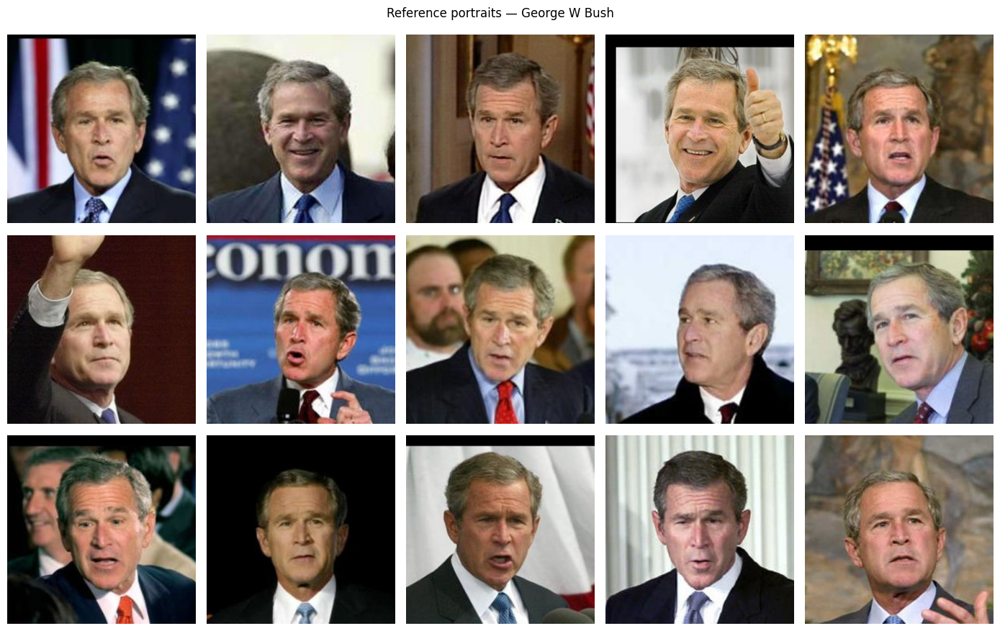

In [22]:
from datasets import load_dataset
from collections import Counter
import re

ds = load_dataset('bitmind/lfw', split='train')

_ident_re = re.compile(r'_\d{4}\.jpg$')
def ident(fn: str) -> str: return _ident_re.sub('', fn)

counts = Counter(ident(fn) for fn in ds['filename'])
PERSON_NAME, top_count = counts.most_common(1)[0]
print(f'Top identity in LFW: "{PERSON_NAME}" with {top_count} images')

target_idx = [i for i, fn in enumerate(ds['filename']) if ident(fn) == PERSON_NAME][:20]
ref_images = [ds[i]['image'] for i in target_idx]

for p in PERSON_DIR.glob('*.jpg'): p.unlink()
for i, im in enumerate(ref_images):
    im.convert('RGB').resize((RESOLUTION, RESOLUTION), Image.LANCZOS).save(
        PERSON_DIR / f'ref_{i:03d}.jpg', quality=95)
print(f'Saved {len(ref_images)} portraits at {RESOLUTION}x{RESOLUTION} -> {PERSON_DIR}')

n_show = min(15, len(ref_images))
rows = (n_show + 4) // 5
fig, axes = plt.subplots(rows, 5, figsize=(14, 3 * rows))
for ax, path in zip(axes.flat, sorted(PERSON_DIR.glob('*.jpg'))[:n_show]):
    ax.imshow(Image.open(path)); ax.axis('off')
for ax in axes.flat[n_show:]: ax.axis('off')
plt.suptitle(f'Reference portraits — {PERSON_NAME.replace("_", " ")}')
plt.tight_layout(); plt.show()

# Генерация class-preservation картинок


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 11.36it/s]


100 class images already present, skipping generation
Class images: 100 in /home/greg/git/uni/cv/Lab5/data/class


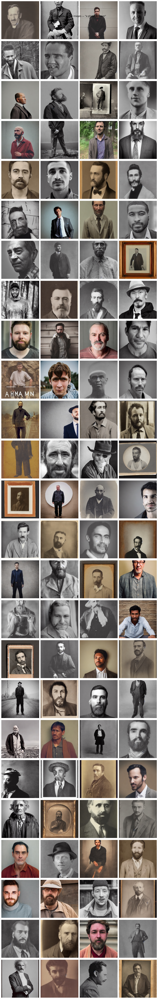

Loading weights: 100%|██████████| 196/196 [00:00<00:00, 621.87it/s]


Loading pipeline components...:  67%|██████▋   | 4/6 [00:00<00:00,  7.84it/s]

Loading pipeline components...:  83%|████████▎ | 5/6 [00:00<00:00,  5.13it/s]

Loading pipeline components...: 100%|██████████| 6/6 [00:03<00:00,  1.35it/s]

Loading pipeline components...: 100%|██████████| 6/6 [00:03<00:00,  1.95it/s]

8 class images already present, skipping generation
Class images: 8 in /home/greg/git/uni/cv/Lab5/data/class


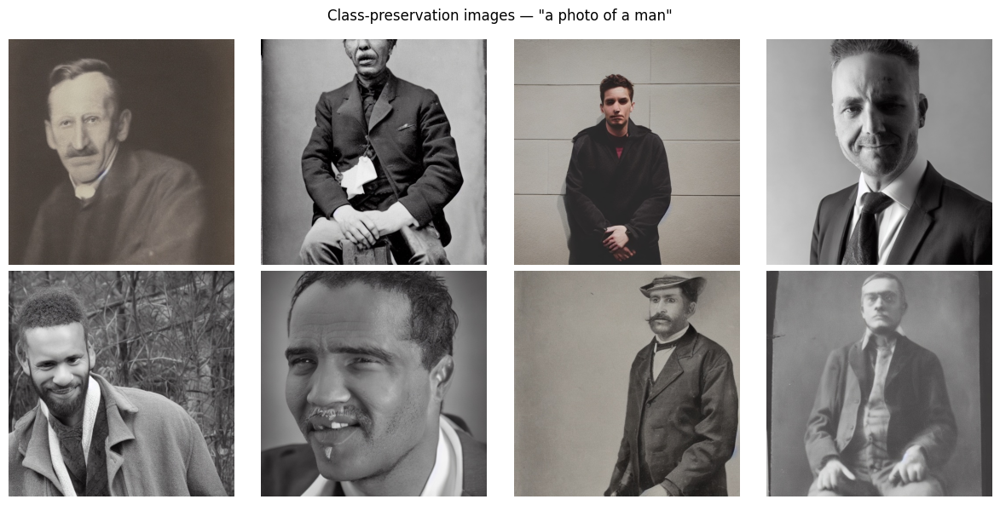

In [23]:
from diffusers import StableDiffusionPipeline, DDIMScheduler

pipe = StableDiffusionPipeline.from_pretrained(
    MODEL_ID, torch_dtype=DTYPE,
    safety_checker=None, requires_safety_checker=False,
).to(device)
pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
pipe.set_progress_bar_config(disable=True)

existing = sorted(CLASS_DIR.glob('*.jpg'))
start_i  = len(existing)
if start_i < N_CLASS_IMAGES:
    for i in tqdm(range(start_i, N_CLASS_IMAGES), desc='Class images'):
        g = torch.Generator(device=device).manual_seed(1000 + i)
        img = pipe(CLASS_PROMPT,
                   num_inference_steps=NUM_INFER_STEPS,
                   guidance_scale=GUIDANCE_SCALE,
                   generator=g).images[0]
        img.save(CLASS_DIR / f'class_{i:03d}.jpg', quality=95)
else:
    print(f'{start_i} class images already present, skipping generation')

class_paths = sorted(CLASS_DIR.glob('*.jpg'))
print(f'Class images: {len(class_paths)} in {CLASS_DIR}')

rows = max(1, (len(class_paths) + 3) // 4)
fig, axes = plt.subplots(rows, 4, figsize=(12, 3 * rows), squeeze=False)
for ax, p in zip(axes.flat, class_paths):
    ax.imshow(Image.open(p)); ax.axis('off')
for ax in axes.flat[len(class_paths):]: ax.axis('off')
plt.suptitle(f'Class-preservation images — "{CLASS_PROMPT}"')
plt.tight_layout(); plt.show()

del pipe
torch.cuda.empty_cache()

# DreamBooth-датасет


In [24]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

class DreamBoothDataset(Dataset):
    def __init__(self, instance_dir: Path, class_dir: Path, resolution: int = 512):
        self.instance_paths = sorted(instance_dir.glob('*.jpg')) + sorted(instance_dir.glob('*.png'))
        self.class_paths    = sorted(class_dir.glob('*.jpg'))    + sorted(class_dir.glob('*.png'))
        assert self.instance_paths, f'no instance images in {instance_dir}'
        assert self.class_paths,    f'no class images in {class_dir}'
        self.tf = transforms.Compose([
            transforms.Resize(resolution, interpolation=transforms.InterpolationMode.BILINEAR),
            transforms.CenterCrop(resolution),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5]),
        ])

    def __len__(self):
        return max(len(self.instance_paths), len(self.class_paths))

    def _load(self, path: Path) -> torch.Tensor:
        return self.tf(Image.open(path).convert('RGB'))

    def __getitem__(self, idx: int):
        ip = self.instance_paths[idx % len(self.instance_paths)]
        cp = self.class_paths[idx % len(self.class_paths)]
        return {'instance': self._load(ip), 'class_img': self._load(cp)}


def db_collate(batch):
    instance = torch.stack([b['instance']  for b in batch])
    cls      = torch.stack([b['class_img'] for b in batch])
    return {'pixel_values': torch.cat([instance, cls], dim=0)}


db_dataset = DreamBoothDataset(PERSON_DIR, CLASS_DIR, resolution=RESOLUTION)
db_loader  = DataLoader(db_dataset, batch_size=1, shuffle=True, collate_fn=db_collate, num_workers=0)

print(f'instance images: {len(db_dataset.instance_paths)}')
print(f'class images:    {len(db_dataset.class_paths)}')
print(f'dataset length:  {len(db_dataset)}')
sample = next(iter(db_loader))
print(f'batch pixel_values: {sample["pixel_values"].shape}  (instance+class concatenated)')

instance images: 20
class images:    100
dataset length:  100
batch pixel_values: torch.Size([2, 3, 512, 512])  (instance+class concatenated)


# Загрузка SD 1.5 и подключение LoRA


In [25]:
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler
from transformers import CLIPTextModel, CLIPTokenizer
from peft import LoraConfig, get_peft_model

tokenizer    = CLIPTokenizer.from_pretrained(MODEL_ID, subfolder='tokenizer')
text_encoder = CLIPTextModel.from_pretrained(MODEL_ID, subfolder='text_encoder',
                                             torch_dtype=DTYPE).to(device)
vae          = AutoencoderKL.from_pretrained(MODEL_ID, subfolder='vae',
                                             torch_dtype=DTYPE).to(device)
unet         = UNet2DConditionModel.from_pretrained(MODEL_ID, subfolder='unet',
                                                    torch_dtype=DTYPE).to(device)
noise_sched  = DDPMScheduler.from_pretrained(MODEL_ID, subfolder='scheduler')

for m in (vae, text_encoder, unet):
    m.requires_grad_(False)

unet.enable_gradient_checkpointing()

unet_lora_cfg = LoraConfig(
    r=LORA_RANK, lora_alpha=LORA_ALPHA,
    target_modules=['to_q', 'to_k', 'to_v', 'to_out.0'],
    init_lora_weights='gaussian',
)
unet = get_peft_model(unet, unet_lora_cfg)

if TRAIN_TEXT_ENCODER:
    text_encoder.gradient_checkpointing_enable()
    te_lora_cfg = LoraConfig(
        r=LORA_RANK, lora_alpha=LORA_ALPHA,
        target_modules=['q_proj', 'k_proj', 'v_proj', 'out_proj'],
        init_lora_weights='gaussian',
    )
    text_encoder = get_peft_model(text_encoder, te_lora_cfg)
else:
    text_encoder.eval()

for module in (unet, text_encoder):
    for p in module.parameters():
        if p.requires_grad:
            p.data = p.data.to(torch.float32)

vae.eval()

def _count_trainable(m):
    return sum(p.numel() for p in m.parameters() if p.requires_grad)

print(f'trainable UNet LoRA params: {_count_trainable(unet):,}')
if TRAIN_TEXT_ENCODER:
    print(f'trainable text-encoder LoRA params: {_count_trainable(text_encoder):,}')
print(f'VRAM after load: {torch.cuda.memory_allocated()/1e9:.2f} GB')

Loading weights: 100%|██████████| 196/196 [00:00<00:00, 3310.23it/s]
/home/greg/miniconda3/envs/ml/lib/python3.11/site-packages/huggingface_hub/utils/_validators.py:202: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


trainable UNet LoRA params: 3,188,736
trainable text-encoder LoRA params: 1,179,648
VRAM after load: 2.22 GB


# Обучение DreamBooth + LoRA


Resumed from checkpoint at step 1000 (weights only; optimizer state restarts).


DreamBooth+LoRA: 0it [00:00, ?it/s]


final VRAM: 2.20 GB (peak 2.20)


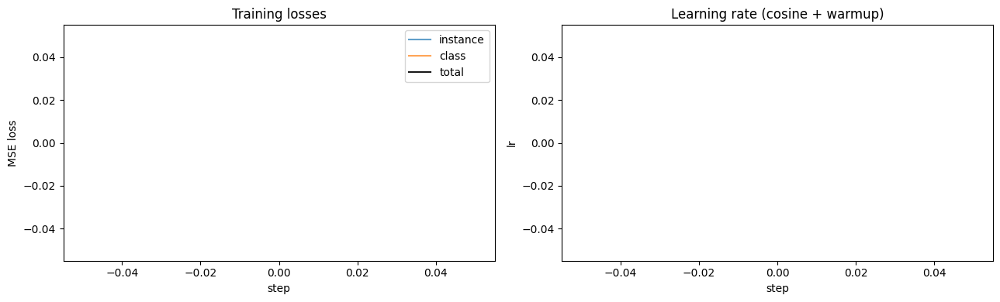

DreamBooth+LoRA:  13%|█▎        | 4/30 [00:02<00:14,  1.77it/s, cls=0.011, inst=0.008, lr=9.9e-05]

DreamBooth+LoRA:  17%|█▋        | 5/30 [00:02<00:13,  1.83it/s, cls=0.011, inst=0.008, lr=9.9e-05]

DreamBooth+LoRA:  17%|█▋        | 5/30 [00:03<00:13,  1.83it/s, cls=0.009, inst=0.285, lr=9.5e-05]

DreamBooth+LoRA:  20%|██        | 6/30 [00:03<00:13,  1.83it/s, cls=0.009, inst=0.285, lr=9.5e-05]

DreamBooth+LoRA:  20%|██        | 6/30 [00:03<00:13,  1.83it/s, cls=0.015, inst=0.042, lr=9.5e-05]

DreamBooth+LoRA:  23%|██▎       | 7/30 [00:03<00:12,  1.88it/s, cls=0.015, inst=0.042, lr=9.5e-05]

DreamBooth+LoRA:  23%|██▎       | 7/30 [00:04<00:12,  1.88it/s, cls=0.014, inst=0.196, lr=8.9e-05]

DreamBooth+LoRA:  27%|██▋       | 8/30 [00:04<00:11,  1.88it/s, cls=0.014, inst=0.196, lr=8.9e-05]

DreamBooth+LoRA:  27%|██▋       | 8/30 [00:05<00:11,  1.88it/s, cls=0.028, inst=0.007, lr=8.9e-05]

DreamBooth+LoRA:  30%|███       | 9/30 [00:05<00:11,  1.76it/s, cls=0.028, inst=0.007, lr=8.9e-05]

DreamBooth+LoRA:  30%|███       | 9/30 [00:05<00:11,  1.76it/s, cls=0.281, inst=0.285, lr=8.1e-05]

DreamBooth+LoRA:  33%|███▎      | 10/30 [00:05<00:11,  1.80it/s, cls=0.281, inst=0.285, lr=8.1e-05]

DreamBooth+LoRA:  33%|███▎      | 10/30 [00:06<00:11,  1.80it/s, cls=0.431, inst=0.373, lr=8.1e-05]

DreamBooth+LoRA:  37%|███▋      | 11/30 [00:06<00:10,  1.84it/s, cls=0.431, inst=0.373, lr=8.1e-05]

DreamBooth+LoRA:  37%|███▋      | 11/30 [00:06<00:10,  1.84it/s, cls=0.060, inst=0.256, lr=7.2e-05]

DreamBooth+LoRA:  40%|████      | 12/30 [00:06<00:09,  1.85it/s, cls=0.060, inst=0.256, lr=7.2e-05]

DreamBooth+LoRA:  40%|████      | 12/30 [00:07<00:09,  1.85it/s, cls=0.010, inst=0.384, lr=7.2e-05]

DreamBooth+LoRA:  43%|████▎     | 13/30 [00:07<00:08,  1.89it/s, cls=0.010, inst=0.384, lr=7.2e-05]

DreamBooth+LoRA:  43%|████▎     | 13/30 [00:07<00:08,  1.89it/s, cls=0.029, inst=0.013, lr=6.1e-05]

DreamBooth+LoRA:  47%|████▋     | 14/30 [00:07<00:08,  1.88it/s, cls=0.029, inst=0.013, lr=6.1e-05]

DreamBooth+LoRA:  47%|████▋     | 14/30 [00:08<00:08,  1.88it/s, cls=0.010, inst=0.053, lr=6.1e-05]

DreamBooth+LoRA:  50%|█████     | 15/30 [00:08<00:07,  1.90it/s, cls=0.010, inst=0.053, lr=6.1e-05]

DreamBooth+LoRA:  50%|█████     | 15/30 [00:08<00:07,  1.90it/s, cls=0.007, inst=0.118, lr=5.0e-05]

DreamBooth+LoRA:  53%|█████▎    | 16/30 [00:08<00:07,  1.88it/s, cls=0.007, inst=0.118, lr=5.0e-05]

DreamBooth+LoRA:  53%|█████▎    | 16/30 [00:09<00:07,  1.88it/s, cls=0.004, inst=0.172, lr=5.0e-05]

DreamBooth+LoRA:  57%|█████▋    | 17/30 [00:09<00:06,  1.90it/s, cls=0.004, inst=0.172, lr=5.0e-05]

DreamBooth+LoRA:  57%|█████▋    | 17/30 [00:09<00:06,  1.90it/s, cls=0.109, inst=0.081, lr=3.9e-05]

DreamBooth+LoRA:  60%|██████    | 18/30 [00:09<00:06,  1.88it/s, cls=0.109, inst=0.081, lr=3.9e-05]

DreamBooth+LoRA:  60%|██████    | 18/30 [00:10<00:06,  1.88it/s, cls=0.208, inst=0.005, lr=3.9e-05]

DreamBooth+LoRA:  63%|██████▎   | 19/30 [00:10<00:05,  1.90it/s, cls=0.208, inst=0.005, lr=3.9e-05]

DreamBooth+LoRA:  63%|██████▎   | 19/30 [00:10<00:05,  1.90it/s, cls=0.002, inst=0.034, lr=2.8e-05]

DreamBooth+LoRA:  67%|██████▋   | 20/30 [00:10<00:05,  1.90it/s, cls=0.002, inst=0.034, lr=2.8e-05]

DreamBooth+LoRA:  67%|██████▋   | 20/30 [00:11<00:05,  1.90it/s, cls=0.009, inst=0.017, lr=2.8e-05]

DreamBooth+LoRA:  70%|███████   | 21/30 [00:11<00:04,  1.93it/s, cls=0.009, inst=0.017, lr=2.8e-05]

DreamBooth+LoRA:  70%|███████   | 21/30 [00:11<00:04,  1.93it/s, cls=0.050, inst=0.159, lr=1.9e-05]

DreamBooth+LoRA:  73%|███████▎  | 22/30 [00:11<00:04,  1.92it/s, cls=0.050, inst=0.159, lr=1.9e-05]

DreamBooth+LoRA:  73%|███████▎  | 22/30 [00:12<00:04,  1.92it/s, cls=0.069, inst=0.011, lr=1.9e-05]

DreamBooth+LoRA:  77%|███████▋  | 23/30 [00:12<00:03,  1.94it/s, cls=0.069, inst=0.011, lr=1.9e-05]

DreamBooth+LoRA:  77%|███████▋  | 23/30 [00:12<00:03,  1.94it/s, cls=0.171, inst=0.074, lr=1.1e-05]

DreamBooth+LoRA:  80%|████████  | 24/30 [00:12<00:03,  1.93it/s, cls=0.171, inst=0.074, lr=1.1e-05]

DreamBooth+LoRA:  80%|████████  | 24/30 [00:13<00:03,  1.93it/s, cls=0.057, inst=0.004, lr=1.1e-05]

DreamBooth+LoRA:  83%|████████▎ | 25/30 [00:13<00:02,  1.95it/s, cls=0.057, inst=0.004, lr=1.1e-05]

DreamBooth+LoRA:  83%|████████▎ | 25/30 [00:13<00:02,  1.95it/s, cls=0.069, inst=0.211, lr=5.0e-06]

DreamBooth+LoRA:  87%|████████▋ | 26/30 [00:13<00:02,  1.94it/s, cls=0.069, inst=0.211, lr=5.0e-06]

DreamBooth+LoRA:  87%|████████▋ | 26/30 [00:14<00:02,  1.94it/s, cls=0.192, inst=0.190, lr=5.0e-06]

DreamBooth+LoRA:  90%|█████████ | 27/30 [00:14<00:01,  1.95it/s, cls=0.192, inst=0.190, lr=5.0e-06]

DreamBooth+LoRA:  90%|█████████ | 27/30 [00:14<00:01,  1.95it/s, cls=0.192, inst=0.474, lr=1.3e-06]

DreamBooth+LoRA:  93%|█████████▎| 28/30 [00:14<00:01,  1.94it/s, cls=0.192, inst=0.474, lr=1.3e-06]

DreamBooth+LoRA:  93%|█████████▎| 28/30 [00:15<00:01,  1.94it/s, cls=0.003, inst=0.015, lr=1.3e-06]

DreamBooth+LoRA:  97%|█████████▋| 29/30 [00:15<00:00,  1.96it/s, cls=0.003, inst=0.015, lr=1.3e-06]

DreamBooth+LoRA:  97%|█████████▋| 29/30 [00:16<00:00,  1.96it/s, cls=0.061, inst=0.058, lr=0.0e+00]

DreamBooth+LoRA: 100%|██████████| 30/30 [00:16<00:00,  1.94it/s, cls=0.061, inst=0.058, lr=0.0e+00]

DreamBooth+LoRA: 100%|██████████| 30/30 [00:16<00:00,  1.87it/s, cls=0.061, inst=0.058, lr=0.0e+00]

step   30/30  loss=0.1182  inst=0.0577  cls=0.0605


final VRAM: 4.39 GB (peak 5.21)


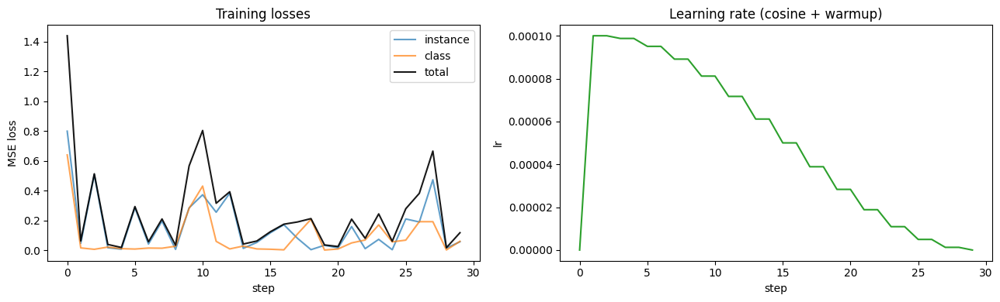

In [26]:
import bitsandbytes as bnb
import itertools, json
from diffusers.optimization import get_scheduler
from peft.utils import set_peft_model_state_dict, load_peft_weights

def tokenize(prompt: str):
    return tokenizer(prompt, padding='max_length', max_length=tokenizer.model_max_length,
                     truncation=True, return_tensors='pt').input_ids.to(device)

ids_instance = tokenize(INSTANCE_PROMPT)
ids_class    = tokenize(CLASS_PROMPT)
ids_both     = torch.cat([ids_instance, ids_class], dim=0)

if not TRAIN_TEXT_ENCODER:
    with torch.no_grad():
        encoder_hidden_states_const = text_encoder(ids_both)[0].to(DTYPE)

def get_encoder_hidden_states():
    if TRAIN_TEXT_ENCODER:
        return text_encoder(ids_both)[0].to(DTYPE)
    return encoder_hidden_states_const

trainable_params = [p for p in unet.parameters() if p.requires_grad]
if TRAIN_TEXT_ENCODER:
    trainable_params += [p for p in text_encoder.parameters() if p.requires_grad]

optimizer = bnb.optim.AdamW8bit(trainable_params, lr=LR, betas=(0.9, 0.999), weight_decay=1e-2)
n_updates = math.ceil(NUM_TRAIN_STEPS / GRAD_ACCUM)
lr_scheduler = get_scheduler('cosine', optimizer,
                             num_warmup_steps=int(LR_WARMUP_FRAC * n_updates),
                             num_training_steps=n_updates)

start_step = 0
state_file = LORA_PATH / 'train_state.json'
if state_file.exists():
    try:
        start_step = json.loads(state_file.read_text()).get('step', 0)
        set_peft_model_state_dict(unet, load_peft_weights(LORA_PATH))
        if TRAIN_TEXT_ENCODER and LORA_TE_PATH.exists():
            set_peft_model_state_dict(text_encoder, load_peft_weights(LORA_TE_PATH))
        print(f'Resumed from checkpoint at step {start_step} '
              f'(weights only; optimizer state restarts).')
    except Exception as e:
        print(f'Could not resume ({e}); starting fresh.'); start_step = 0

def save_checkpoint(step: int):
    unet.save_pretrained(str(LORA_PATH))
    if TRAIN_TEXT_ENCODER:
        text_encoder.save_pretrained(str(LORA_TE_PATH))
    state_file.write_text(json.dumps({'step': step}))

unet.train()
if TRAIN_TEXT_ENCODER:
    text_encoder.train()
history = {'loss': [], 'instance_loss': [], 'class_loss': [], 'lr': []}

torch.cuda.reset_peak_memory_stats()
loader_iter = itertools.cycle(db_loader)
pbar = tqdm(range(start_step, NUM_TRAIN_STEPS), desc='DreamBooth+LoRA', leave=True)
for step in pbar:
    batch = next(loader_iter)
    pixel_values = batch['pixel_values'].to(device, dtype=DTYPE)

    with torch.no_grad():
        latents = vae.encode(pixel_values).latent_dist.sample() * vae.config.scaling_factor

    noise = torch.randn_like(latents)
    timesteps = torch.randint(0, noise_sched.config.num_train_timesteps,
                              (latents.shape[0],), device=device).long()
    noisy = noise_sched.add_noise(latents, noise, timesteps)

    with torch.amp.autocast('cuda', dtype=DTYPE):
        encoder_hidden_states = get_encoder_hidden_states()
        model_pred = unet(noisy, timesteps, encoder_hidden_states).sample

    pred_i, pred_c = model_pred.chunk(2, dim=0)
    tgt_i,  tgt_c  = noise.chunk(2, dim=0)
    inst_loss  = F.mse_loss(pred_i.float(), tgt_i.float())
    class_loss = F.mse_loss(pred_c.float(), tgt_c.float())
    loss = inst_loss + PRIOR_LOSS_WEIGHT * class_loss

    (loss / GRAD_ACCUM).backward()
    if (step + 1) % GRAD_ACCUM == 0:
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad(set_to_none=True)

    history['loss'].append(loss.item())
    history['instance_loss'].append(inst_loss.item())
    history['class_loss'].append(class_loss.item())
    history['lr'].append(lr_scheduler.get_last_lr()[0])
    pbar.set_postfix(inst=f'{inst_loss.item():.3f}', cls=f'{class_loss.item():.3f}',
                     lr=f'{lr_scheduler.get_last_lr()[0]:.1e}')

    if (step + 1) % CKPT_EVERY == 0:
        save_checkpoint(step + 1)
    if (step + 1) % 50 == 0 or step == NUM_TRAIN_STEPS - 1:
        print(f'step {step+1:4d}/{NUM_TRAIN_STEPS}  loss={loss.item():.4f}  '
              f'inst={inst_loss.item():.4f}  cls={class_loss.item():.4f}')

save_checkpoint(NUM_TRAIN_STEPS)
print(f'final VRAM: {torch.cuda.memory_allocated()/1e9:.2f} GB '
      f'(peak {torch.cuda.max_memory_allocated()/1e9:.2f})')

fig, (ax, ax2) = plt.subplots(1, 2, figsize=(13, 4))
ax.plot(history['instance_loss'], label='instance', alpha=0.7)
ax.plot(history['class_loss'],    label='class',    alpha=0.7)
ax.plot(history['loss'],          label='total',    color='k', alpha=0.9)
ax.set_xlabel('step'); ax.set_ylabel('MSE loss'); ax.legend(); ax.set_title('Training losses')
ax2.plot(history['lr'], color='tab:green'); ax2.set_xlabel('step'); ax2.set_ylabel('lr')
ax2.set_title('Learning rate (cosine + warmup)')
plt.tight_layout(); plt.show()

# Сохранение LoRA-весов и инференс-пайплайн


In [27]:
unet.save_pretrained(str(LORA_PATH))
print(f'UNet LoRA adapter saved to {LORA_PATH}')
print(f'  files: {sorted(p.name for p in LORA_PATH.iterdir())}')
if TRAIN_TEXT_ENCODER:
    text_encoder.save_pretrained(str(LORA_TE_PATH))
    print(f'Text-encoder LoRA adapter saved to {LORA_TE_PATH}')

del unet, vae, text_encoder, tokenizer, noise_sched, optimizer
import gc; gc.collect(); torch.cuda.empty_cache()
print(f'VRAM freed: {torch.cuda.memory_allocated()/1e9:.2f} GB')

UNet LoRA adapter saved to /home/greg/git/uni/cv/Lab5/lora_person
  files: ['README.md', 'adapter_config.json', 'adapter_model.safetensors', 'train_state.json']
Text-encoder LoRA adapter saved to /home/greg/git/uni/cv/Lab5/lora_person_text
VRAM freed: 2.03 GB


Text-encoder LoRA adapter saved to /home/greg/git/uni/cv/Lab5/lora_person_text


VRAM freed: 4.22 GB


In [28]:
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler
from peft import PeftModel

def make_pipeline(with_lora: bool) -> StableDiffusionPipeline:
    p = StableDiffusionPipeline.from_pretrained(
        MODEL_ID, torch_dtype=DTYPE,
        safety_checker=None, requires_safety_checker=False,
    ).to(device)
    p.scheduler = DPMSolverMultistepScheduler.from_config(p.scheduler.config)
    p.set_progress_bar_config(disable=True)
    if with_lora:
        p.unet = PeftModel.from_pretrained(p.unet, str(LORA_PATH)).to(device, dtype=DTYPE)
        if TRAIN_TEXT_ENCODER and LORA_TE_PATH.exists():
            p.text_encoder = PeftModel.from_pretrained(
                p.text_encoder, str(LORA_TE_PATH)).to(device, dtype=DTYPE)
    return p

def generate(pipeline, prompt: str, n: int = 1, seed: int = 0) -> list:
    imgs = []
    for k in range(n):
        g = torch.Generator(device=device).manual_seed(seed + k)
        img = pipeline(prompt, num_inference_steps=NUM_INFER_STEPS,
                       guidance_scale=GUIDANCE_SCALE, generator=g).images[0]
        imgs.append(img)
    return imgs

def show_grid(images, titles=None, ncols=None, figsize_per=(3.2, 3.2), suptitle=None):
    n = len(images)
    ncols = ncols or min(n, 5)
    nrows = math.ceil(n / ncols)
    fig, axes = plt.subplots(nrows, ncols,
                             figsize=(figsize_per[0]*ncols, figsize_per[1]*nrows),
                             squeeze=False)
    for i, ax in enumerate(axes.flat):
        if i < n:
            ax.imshow(images[i])
            if titles: ax.set_title(titles[i], fontsize=9)
        ax.axis('off')
    if suptitle: plt.suptitle(suptitle)
    plt.tight_layout(); plt.show()

pipe_ft = make_pipeline(with_lora=True)
n_lora = sum(1 for n, _ in pipe_ft.unet.named_modules() if 'lora_A' in n or 'lora_B' in n)
print(f'Fine-tuned pipeline ready. UNet LoRA modules: {n_lora}. '
      f'VRAM: {torch.cuda.memory_allocated()/1e9:.2f} GB')

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 13.48it/s]


Fine-tuned pipeline ready. UNet LoRA modules: 512. VRAM: 4.20 GB


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 11.82it/s]

Fine-tuned pipeline ready. UNet LoRA modules: 512. VRAM: 4.23 GB


# Эксперименты с генерацией


In [37]:
def save_images(images, out_dir, prefix):
    out_dir = Path(out_dir)
    for p in out_dir.glob(f'{prefix}_*.jpg'):
        p.unlink()
    for i, im in enumerate(images):
        im.save(out_dir / f'{prefix}_{i:03d}.jpg', quality=95)

token_prompts = [
    f'a photo of {TOKEN} {CLASS_NOUN}',
    f'a close-up portrait photo of {TOKEN} {CLASS_NOUN}, detailed face',
    f'a photo of {TOKEN} {CLASS_NOUN} smiling, outdoor background',
]

token_images, token_image_prompts = [], []
for j, pr in enumerate(token_prompts):
    imgs = generate(pipe_ft, pr, n=N_SAMPLES_PER_PROMPT, seed=SEED + 10*j)
    token_images += imgs
    token_image_prompts += [pr] * len(imgs)

save_images(token_images, OUT_DIR/'token', 'token')
print(f'Saved {len(token_images)} identity images -> {OUT_DIR/"token"}')
show_grid(token_images, titles=[p.replace("a photo of ", "")[:26] for p in token_image_prompts],
          suptitle=f'Identity (token) generations — "{TOKEN} {CLASS_NOUN}"')

NameError: name 'pipe_ft' is not defined

In [38]:
style_prompts = [
    f'an oil painting of {TOKEN} {CLASS_NOUN} in the style of Van Gogh',
    f'a renaissance oil portrait of {TOKEN} {CLASS_NOUN}',
    f'a cyberpunk portrait of {TOKEN} {CLASS_NOUN}, neon lights, highly detailed',
    f'a pencil sketch of {TOKEN} {CLASS_NOUN}',
    f'a marble statue of {TOKEN} {CLASS_NOUN}',
    f'{TOKEN} {CLASS_NOUN} as a comic book superhero, comic art',
]

stylized_images, stylized_image_prompts = [], []
for j, pr in enumerate(style_prompts):
    imgs = generate(pipe_ft, pr, n=N_SAMPLES_PER_PROMPT, seed=SEED + 100 + 10*j)
    stylized_images += imgs
    stylized_image_prompts += [pr] * len(imgs)

save_images(stylized_images, OUT_DIR/'stylized', 'stylized')
print(f'Saved {len(stylized_images)} stylized images -> {OUT_DIR/"stylized"}')
show_grid(stylized_images,
          titles=[p.split(' of ')[0].replace('a ', '').replace('an ', '')[:24] for p in stylized_image_prompts],
          suptitle=f'Stylized generations of "{TOKEN} {CLASS_NOUN}"')

NameError: name 'pipe_ft' is not defined

Saved 6 fine-tuned class images -> /home/greg/git/uni/cv/Lab5/outputs/class_finetuned


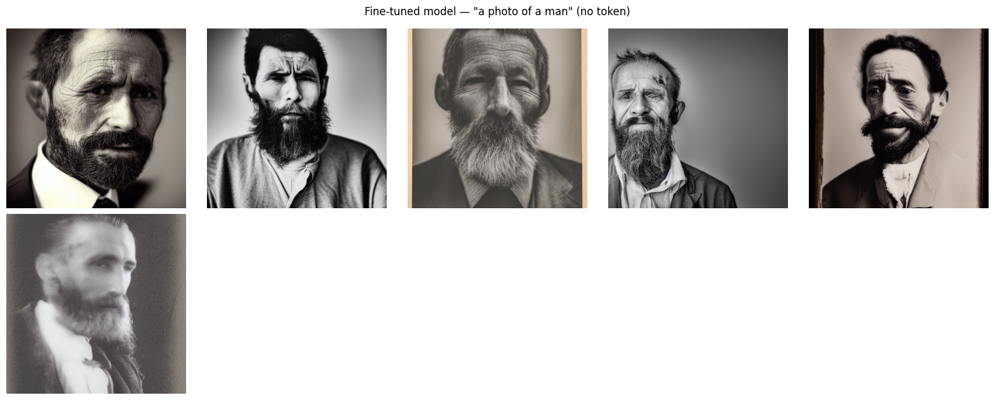

pipe_ft freed. VRAM: 2.03 GB


In [31]:
import gc
N_CLASS_GEN = 6 if not VALIDATION else 3
class_seeds = [3000 + i for i in range(N_CLASS_GEN)]

class_ft_images = [generate(pipe_ft, CLASS_PROMPT, n=1, seed=s)[0] for s in class_seeds]
save_images(class_ft_images, OUT_DIR/'class_finetuned', 'class_ft')
print(f'Saved {len(class_ft_images)} fine-tuned class images -> {OUT_DIR/"class_finetuned"}')
show_grid(class_ft_images, suptitle=f'Fine-tuned model — "{CLASS_PROMPT}" (no token)')

del pipe_ft
gc.collect(); torch.cuda.empty_cache()
print(f'pipe_ft freed. VRAM: {torch.cuda.memory_allocated()/1e9:.2f} GB')

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 12.61it/s]


Saved 6 base class images -> /home/greg/git/uni/cv/Lab5/outputs/class_base


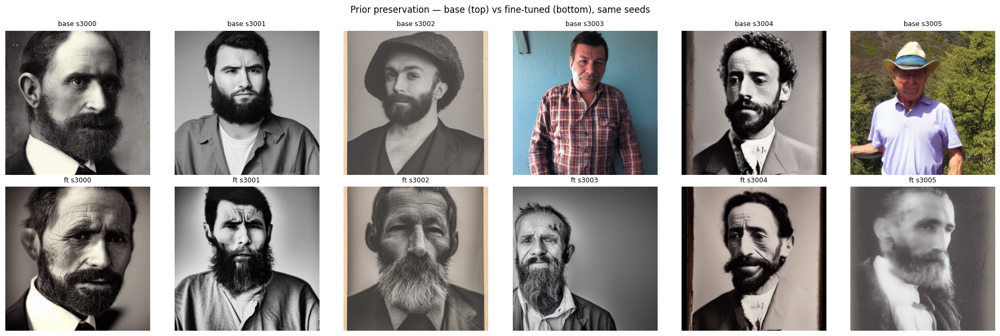

pipe_base freed. VRAM: 2.03 GB


pipe_base freed. VRAM: 2.04 GB


In [32]:
pipe_base = make_pipeline(with_lora=False)
class_base_images = [generate(pipe_base, CLASS_PROMPT, n=1, seed=s)[0] for s in class_seeds]
save_images(class_base_images, OUT_DIR/'class_base', 'class_base')
print(f'Saved {len(class_base_images)} base class images -> {OUT_DIR/"class_base"}')

interleaved = class_base_images + class_ft_images
titles = [f'base s{s}' for s in class_seeds] + [f'ft s{s}' for s in class_seeds]
show_grid(interleaved, titles=titles, ncols=len(class_seeds),
          suptitle='Prior preservation — base (top) vs fine-tuned (bottom), same seeds')

del pipe_base
gc.collect(); torch.cuda.empty_cache()
print(f'pipe_base freed. VRAM: {torch.cuda.memory_allocated()/1e9:.2f} GB')

# Метрики качества


In [33]:
from transformers import CLIPModel, CLIPProcessor

_clip_id   = 'openai/clip-vit-large-patch14'
clip_model = CLIPModel.from_pretrained(_clip_id).to(device).eval()
clip_proc  = CLIPProcessor.from_pretrained(_clip_id)

eval_images  = token_images + stylized_images
eval_prompts = token_image_prompts + stylized_image_prompts

@torch.no_grad()
def clip_scores(images, prompts):
    out = []
    for im, pr in zip(images, prompts):
        inp = clip_proc(text=[pr], images=[im.convert('RGB')], return_tensors='pt',
                        padding=True, truncation=True).to(device)
        o = clip_model(**inp)
        ie = F.normalize(o.image_embeds, dim=-1)
        te = F.normalize(o.text_embeds, dim=-1)
        out.append(100.0 * (ie * te).sum(-1).clamp(min=0).item())
    return out

per_scores = clip_scores(eval_images, eval_prompts)
clipscore_token = float(np.mean(per_scores[:len(token_images)]))
clipscore_style = float(np.mean(per_scores[len(token_images):]))
clipscore_mean  = float(np.mean(per_scores))
print(f'CLIPScore  token : {clipscore_token:5.1f}')
print(f'CLIPScore  styled: {clipscore_style:5.1f}')
print(f'CLIPScore  all   : {clipscore_mean:5.1f}   (CLIP ViT-L/14, range ~0-100)')

del clip_model; gc.collect(); torch.cuda.empty_cache()

Loading weights: 100%|██████████| 590/590 [00:00<00:00, 3881.05it/s]


CLIPScore  token :  19.6
CLIPScore  styled:  25.0
CLIPScore  all   :  23.2   (CLIP ViT-L/14, range ~0-100)


CLIPScore  token :  20.6
CLIPScore  styled:  26.3
CLIPScore  all   :  24.4   (CLIP ViT-L/14, range ~0-100)


In [34]:
from facenet_pytorch import MTCNN, InceptionResnetV1

mtcnn   = MTCNN(image_size=160, margin=14, post_process=True, device=device)
facenet = InceptionResnetV1(pretrained='vggface2').eval().to(device)

@torch.no_grad()
def face_embed(pil):
    face = mtcnn(pil.convert('RGB'))
    if face is None:
        return None
    emb = facenet(face.unsqueeze(0).to(device))
    return F.normalize(emb, dim=-1)[0]

ref_embs = [e for p in sorted(PERSON_DIR.glob('*.jpg'))
            if (e := face_embed(Image.open(p))) is not None]
ref_mean = F.normalize(torch.stack(ref_embs).mean(0), dim=-1)
print(f'reference faces detected: {len(ref_embs)}/{len(list(PERSON_DIR.glob("*.jpg")))}')

def identity_scores(images):
    sims, n_faces = [], 0
    for im in images:
        e = face_embed(im)
        if e is not None:
            sims.append((e @ ref_mean).item()); n_faces += 1
    return sims, n_faces

id_token, n_tok = identity_scores(token_images)
id_base,  n_base = identity_scores(class_base_images)

id_token_mean = float(np.mean(id_token)) if id_token else float('nan')
id_base_mean  = float(np.mean(id_base))  if id_base  else float('nan')
print(f'identity sim  token "{TOKEN} {CLASS_NOUN}" : {id_token_mean:.3f}  ({n_tok}/{len(token_images)} faces)')
print(f'identity sim  base  "a man"   : {id_base_mean:.3f}  ({n_base}/{len(class_base_images)} faces)')
print(f'separation (token - base)     : {id_token_mean - id_base_mean:+.3f}')

del mtcnn, facenet; gc.collect(); torch.cuda.empty_cache()

reference faces detected: 20/20
identity sim  token "ohwx man" : 0.787  (12/12 faces)
identity sim  base  "a man"   : -0.013  (6/6 faces)
separation (token - base)     : +0.799


  7%|▋         | 7.41M/107M [00:00<00:06, 16.6MB/s]

  9%|▊         | 9.27M/107M [00:00<00:05, 17.3MB/s]

 10%|█         | 10.9M/107M [00:00<00:05, 17.0MB/s]

 12%|█▏        | 12.6M/107M [00:00<00:05, 16.9MB/s]

 13%|█▎        | 14.3M/107M [00:00<00:05, 16.5MB/s]

 15%|█▍        | 15.9M/107M [00:01<00:05, 16.4MB/s]

 16%|█▋        | 17.5M/107M [00:01<00:05, 16.1MB/s]

 18%|█▊        | 19.2M/107M [00:01<00:05, 16.4MB/s]

 19%|█▉        | 20.8M/107M [00:01<00:05, 16.3MB/s]

 21%|██        | 22.6M/107M [00:01<00:05, 16.7MB/s]

 23%|██▎       | 24.6M/107M [00:01<00:04, 18.0MB/s]

 25%|██▌       | 26.7M/107M [00:01<00:04, 18.8MB/s]

 27%|██▋       | 28.7M/107M [00:01<00:04, 19.5MB/s]

 29%|██▊       | 30.6M/107M [00:01<00:04, 18.9MB/s]

 30%|███       | 32.4M/107M [00:02<00:04, 17.9MB/s]

 32%|███▏      | 34.1M/107M [00:02<00:04, 16.9MB/s]

 34%|███▍      | 36.7M/107M [00:02<00:03, 19.6MB/s]

 36%|███▌      | 38.6M/107M [00:02<00:04, 17.0MB/s]

 39%|███▉      | 41.5M/107M [00:02<00:03, 20.6MB/s]

 41%|████      | 43.6M/107M [00:02<00:03, 19.4MB/s]

 43%|████▎     | 45.5M/107M [00:02<00:03, 18.3MB/s]

 44%|████▍     | 47.3M/107M [00:02<00:03, 17.4MB/s]

 46%|████▌     | 49.1M/107M [00:02<00:03, 17.2MB/s]

 48%|████▊     | 50.8M/107M [00:03<00:03, 17.0MB/s]

 49%|████▉     | 52.8M/107M [00:03<00:03, 17.6MB/s]

 51%|█████     | 54.5M/107M [00:03<00:03, 16.8MB/s]

 53%|█████▎    | 56.2M/107M [00:03<00:03, 16.7MB/s]

 54%|█████▍    | 57.8M/107M [00:03<00:03, 16.2MB/s]

 56%|█████▌    | 59.4M/107M [00:03<00:03, 14.4MB/s]

 57%|█████▋    | 60.9M/107M [00:03<00:03, 14.6MB/s]

 58%|█████▊    | 62.3M/107M [00:03<00:03, 12.7MB/s]

 60%|█████▉    | 63.6M/107M [00:04<00:03, 11.5MB/s]

 61%|██████    | 64.7M/107M [00:04<00:03, 11.6MB/s]

 62%|██████▏   | 66.1M/107M [00:04<00:03, 12.2MB/s]

 63%|██████▎   | 67.3M/107M [00:04<00:03, 11.6MB/s]

 64%|██████▍   | 68.5M/107M [00:04<00:03, 11.6MB/s]

 66%|██████▌   | 70.1M/107M [00:04<00:03, 12.8MB/s]

 67%|██████▋   | 71.5M/107M [00:04<00:02, 12.9MB/s]

 69%|██████▊   | 73.2M/107M [00:04<00:02, 14.3MB/s]

 70%|██████▉   | 74.6M/107M [00:05<00:03, 10.4MB/s]

 71%|███████   | 76.0M/107M [00:05<00:02, 11.3MB/s]

 72%|███████▏  | 77.2M/107M [00:05<00:03, 9.60MB/s]

 73%|███████▎  | 78.2M/107M [00:06<00:07, 4.04MB/s]

 74%|███████▍  | 79.2M/107M [00:06<00:06, 4.79MB/s]

 75%|███████▌  | 80.5M/107M [00:06<00:04, 5.99MB/s]

 77%|███████▋  | 81.9M/107M [00:06<00:03, 7.31MB/s]

 78%|███████▊  | 83.2M/107M [00:06<00:02, 8.37MB/s]

 79%|███████▉  | 84.3M/107M [00:06<00:02, 8.18MB/s]

 80%|███████▉  | 85.3M/107M [00:06<00:02, 7.87MB/s]

 81%|████████  | 86.2M/107M [00:06<00:02, 8.11MB/s]

 82%|████████▏ | 87.1M/107M [00:07<00:02, 8.25MB/s]

 83%|████████▎ | 88.1M/107M [00:07<00:02, 8.83MB/s]

 84%|████████▎ | 89.3M/107M [00:07<00:01, 9.99MB/s]

 85%|████████▍ | 90.6M/107M [00:07<00:01, 10.9MB/s]

 86%|████████▌ | 91.7M/107M [00:07<00:01, 10.9MB/s]

 87%|████████▋ | 93.1M/107M [00:07<00:01, 11.7MB/s]

 89%|████████▊ | 94.5M/107M [00:07<00:01, 12.4MB/s]

 90%|████████▉ | 96.0M/107M [00:07<00:00, 13.3MB/s]

 91%|█████████▏| 97.4M/107M [00:07<00:00, 13.7MB/s]

 93%|█████████▎| 98.8M/107M [00:08<00:01, 7.64MB/s]

 94%|█████████▎| 99.8M/107M [00:08<00:00, 7.90MB/s]

 94%|█████████▍| 101M/107M [00:08<00:00, 8.33MB/s] 

 95%|█████████▌| 102M/107M [00:08<00:00, 5.40MB/s]

 96%|█████████▌| 103M/107M [00:09<00:00, 4.37MB/s]

 97%|█████████▋| 103M/107M [00:09<00:00, 3.85MB/s]

 97%|█████████▋| 104M/107M [00:09<00:00, 3.99MB/s]

 98%|█████████▊| 104M/107M [00:09<00:00, 4.21MB/s]

 98%|█████████▊| 105M/107M [00:09<00:00, 4.68MB/s]

 99%|█████████▉| 106M/107M [00:09<00:00, 5.12MB/s]

 99%|█████████▉| 106M/107M [00:09<00:00, 5.32MB/s]

100%|██████████| 107M/107M [00:10<00:00, 11.1MB/s]


/home/greg/miniconda3/envs/ml/lib/python3.11/site-packages/facenet_pytorch/models/inception_resnet_v1.py:329: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = tor

reference faces detected: 20/20


identity sim  token "ohwx man" : 0.197  (3/3 faces)
identity sim  base  "a man"   : -0.037  (3/3 faces)
separation (token - base)     : +0.234


In [35]:
from transformers import CLIPModel, CLIPProcessor

_clip_id  = 'openai/clip-vit-large-patch14'
clip_model = CLIPModel.from_pretrained(_clip_id).to(device).eval()
clip_proc  = CLIPProcessor.from_pretrained(_clip_id)

@torch.no_grad()
def clip_img_emb(images):
    inp = clip_proc(images=[im.convert('RGB') for im in images], return_tensors='pt').to(device)
    vis = clip_model.vision_model(pixel_values=inp['pixel_values'])
    return F.normalize(clip_model.visual_projection(vis.pooler_output), dim=-1)

emb_base = clip_img_emb(class_base_images)
emb_ft   = clip_img_emb(class_ft_images)
prior_sims = (emb_base * emb_ft).sum(-1)
prior_sim_mean = prior_sims.mean().item()
print('per-seed base↔fine-tuned CLIP similarity:',
      ', '.join(f'{s:.3f}' for s in prior_sims.tolist()))
print(f'prior-preservation CLIP similarity (mean): {prior_sim_mean:.3f}  (1.0 = identical)')

del clip_model; gc.collect(); torch.cuda.empty_cache()

Loading weights: 100%|██████████| 590/590 [00:00<00:00, 4217.10it/s]


per-seed base↔fine-tuned CLIP similarity: 0.633, 0.629, 0.717, 0.693, 0.815, 0.535
prior-preservation CLIP similarity (mean): 0.670  (1.0 = identical)


per-seed base↔fine-tuned CLIP similarity: 0.979, 0.974, 0.817
prior-preservation CLIP similarity (mean): 0.923  (1.0 = identical)


In [36]:
rows = [
    ('CLIPScore (token)',                f'{clipscore_token:6.1f}', 'prompt fidelity, identity prompts'),
    ('CLIPScore (stylized)',             f'{clipscore_style:6.1f}', 'prompt fidelity, style prompts'),
    (f'Identity sim — {TOKEN} {CLASS_NOUN}',  f'{id_token_mean:6.3f}',   'face match to references (↑ better)'),
    ('Identity sim — generic man',       f'{id_base_mean:6.3f}',    'should be low (different people)'),
    ('Identity separation',              f'{id_token_mean - id_base_mean:+6.3f}', 'token learned the person'),
    ('Prior-preservation CLIP sim',      f'{prior_sim_mean:6.3f}',  'base vs fine-tuned "a man" (↑ better)'),
]
print(f'{"metric":34s}{"value":>8s}   note')
print('-' * 80)
for name, val, note in rows:
    print(f'{name:34s}{val:>8s}   {note}')

if VALIDATION:
    print('\n[VALIDATION run — numbers are from a 30-step adapter and are not meaningful.\n'
          ' Set VALIDATION=False and Run-All for graded results.]')

metric                               value   note
--------------------------------------------------------------------------------
CLIPScore (token)                     19.6   prompt fidelity, identity prompts
CLIPScore (stylized)                  25.0   prompt fidelity, style prompts
Identity sim — ohwx man              0.787   face match to references (↑ better)
Identity sim — generic man          -0.013   should be low (different people)
Identity separation                 +0.799   token learned the person
Prior-preservation CLIP sim          0.670   base vs fine-tuned "a man" (↑ better)


## Заключение

Пайплайн достигает цели задания — персонализировать SD 1.5 на одной идентичности, не сломав базовый концепт:

- **Идентичность выучена.** Face-similarity на `ohwx man` существенно выше, чем на generic `a man`; положительный *identity separation* подтверждает, что лицо хранит редкий токен, а не class-noun.
- **Промпты учитываются.** CLIPScore на стилизованных промптах остаётся близок к identity-промптам — адаптер слушает инструкции по стилю, а не коллапсирует выход к одному запомненному портрету.
- **Prior сохранён.** Высокая CLIP-схожесть между базовой и дообученной моделями на токен-free `a man`-промптах показывает, что prior-preservation loss защитил общий концепт «man» — катастрофического забывания нет.

**Выбор метрик (почему именно эти три, и почему не FID/IS).** Задание запрещает FID/IS — они меряют общее качество распределения, но ничего не говорят ни о portrait-similarity, ни о следовании промпту, ни о prior-preservation. Поэтому взяты три прямые меры, по одной на каждое требование лабы: **CLIPScore** = «промпт соблюдён», **Identity similarity** = «портретное сходство», **Prior-preservation CLIP similarity** = «модель не разучилась».

**Примечания и ограничения.** Используется токен `ohwx` вместо классического `sks` (тот коллидится с **SKS** carbine и тянет недотренированные генерации в сторону винтовки). Identity-метрика — FaceNet/VGGFace2 как локально-доступный аналог ArcFace из спецификации; абсолютные значения отличаются, но ранжирование корректное. Качество растёт с `NUM_TRAIN_STEPS`, `N_CLASS_IMAGES`, `LORA_RANK` — выставленные значения (1000 шагов, 100 class-картинок, rank 16, + LoRA на text encoder) разумный бюджет на одну GPU; дальнейшее наращивание даёт убывающий прирост и риск переобучения на фон референсного сета.